# US Accidents Exploratory Data Analysis
TODO : talk about EDA
Talk about the dataset, it's source, What it contains, how it will be useful
  - Kaggle
  - Information about accidents
  - Can be useful to prevent accidents
  - Mention that this doesnt contain data for New York

In [ ]:
pip install opendatasets --upgrade --quiet

In [ ]:
import opendatasets as od
download_url = 'https://www.kaggle.com/datasets/sobhanmoosavi/us-accidents'
od.download(download_url)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: praveetsinha
Your Kaggle Key: ··········
Dataset URL: https://www.kaggle.com/datasets/sobhanmoosavi/us-accidents


100%|██████████| 653M/653M [00:04<00:00, 171MB/s] 


In [ ]:
data_filename = './us-accidents/US_Accidents_March23.csv'

## Data Preparation and Cleaning
  - Load the file using Pandas
  - Look at some information about the data & the coloumns
  - Fix any missing or incorrect values

In [ ]:
import pandas as pd

In [ ]:
rows_to_load = 4_200_000  # 4.2 million
df = pd.read_csv(data_filename, nrows=rows_to_load)


In [ ]:
df

,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,A-1,Source2,3,2016-02-08 05:46:00,2016-02-08 11:00:00,39.865147,-84.058723,NaN,NaN,0.010,...,False,False,False,False,False,False,Night,Night,Night,Night
1,A-2,Source2,2,2016-02-08 06:07:59,2016-02-08 06:37:59,39.928059,-82.831184,NaN,NaN,0.010,...,False,False,False,False,False,False,Night,Night,Night,Day
2,A-3,Source2,2,2016-02-08 06:49:27,2016-02-08 07:19:27,39.063148,-84.032608,NaN,NaN,0.010,...,False,False,False,False,True,False,Night,Night,Day,Day
3,A-4,Source2,3,2016-02-08 07:23:34,2016-02-08 07:53:34,39.747753,-84.205582,NaN,NaN,0.010,...,False,False,False,False,False,False,Night,Day,Day,Day
4,A-5,Source2,2,2016-02-08 07:39:07,2016-02-08 08:09:07,39.627781,-84.188354,NaN,NaN,0.010,...,False,False,False,False,True,False,Day,Day,Day,Day
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4199995,A-4231669,Source1,2,2022-11-21 13:56:00.000000000,2022-11-21 15:13:40.000000000,29.335842,-98.569615,29.336990,-98.566847,0.185,...,False,False,False,False,False,False,Day,Day,Day,Day
4199996,A-4231670,Source1,2,2022-01-02 18:54:00.000000000,2022-01-02 20:34:30.000000000,33.568296,-117.672122,33.539904,-117.674531,1.967,...,False,False,False,False,False,False,Night,Night,Night,Night
4199997,A-4231671,Source1,2,2022-12-22 09:15:33.000000000,2022-12-22 10:30:35.000000000,38.559770,-78.746406,38.554987,-78.749487,0.370,...,False,False,False,False,False,False,Day,Day,Day,Day
4199998,A-4231672,Source1,2,2022-01-30 11:49:30.000000000,2022-01-30 12:11:30.000000000,35.155469,-80.794153,35.152340,-80.793736,0.217,...,False,False,False,False,False,False,Day,Day,Day,Day


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4200000 entries, 0 to 4199999
Data columns (total 46 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   ID                     object 
 1   Source                 object 
 2   Severity               int64  
 3   Start_Time             object 
 4   End_Time               object 
 5   Start_Lat              float64
 6   Start_Lng              float64
 7   End_Lat                float64
 8   End_Lng                float64
 9   Distance(mi)           float64
 10  Description            object 
 11  Street                 object 
 12  City                   object 
 13  County                 object 
 14  State                  object 
 15  Zipcode                object 
 16  Country                object 
 17  Timezone               object 
 18  Airport_Code           object 
 19  Weather_Timestamp      object 
 20  Temperature(F)         float64
 21  Wind_Chill(F)          float64
 22  Humidity(%)       

In [ ]:
df.describe()

,Severity,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Precipitation(in)
count,4.200000e+06,4.200000e+06,4.200000e+06,797238.000000,797238.000000,4.200000e+06,4.124214e+06,2.517761e+06,4.119142e+06,4.135301e+06,4.114430e+06,3.780943e+06,2.390334e+06
mean,2.299213e+00,3.617040e+01,-9.364998e+01,36.367215,-94.709452,3.466167e-01,6.219861e+01,5.680503e+01,6.568332e+01,2.965939e+01,9.098918e+00,7.903634e+00,1.159892e-02
std,5.059505e-01,4.872308e+00,1.663423e+01,5.111789,17.781776,1.731239e+00,1.875298e+01,2.307026e+01,2.258364e+01,8.796312e-01,2.719208e+00,5.288767e+00,1.498389e-01
min,1.000000e+00,2.455480e+01,-1.246238e+02,24.570107,-124.539056,0.000000e+00,-8.900000e+01,-8.900000e+01,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,2.000000e+00,3.338195e+01,-1.118919e+02,33.581644,-117.341789,0.000000e+00,5.000000e+01,3.950000e+01,4.900000e+01,2.952000e+01,1.000000e+01,4.600000e+00,0.000000e+00
50%,2.000000e+00,3.555151e+01,-8.727734e+01,36.598129,-87.630190,0.000000e+00,6.400000e+01,6.100000e+01,6.800000e+01,2.991000e+01,1.000000e+01,7.000000e+00,0.000000e+00
75%,3.000000e+00,4.003722e+01,-8.075427e+01,40.322927,-80.210016,1.000000e-02,7.600000e+01,7.500000e+01,8.500000e+01,3.006000e+01,1.000000e+01,1.040000e+01,0.000000e+00
max,4.000000e+00,4.900220e+01,-6.711317e+01,49.075000,-67.109242,4.417500e+02,2.030000e+02,1.960000e+02,1.000000e+02,5.863000e+01,1.400000e+02,8.228000e+02,3.647000e+01


In [ ]:
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
numeric_df = df.select_dtypes(include=numerics)
len(numeric_df.columns)

13

Percentage of missing values per coloumn

In [ ]:
missing_percentages = df.isna().sum().sort_values(ascending=False)/ len(df)
missing_percentages

,0
End_Lng,0.810181
End_Lat,0.810181
Precipitation(in),0.430873
Wind_Chill(F),0.400533
Wind_Speed(mph),0.099775
Visibility(mi),0.020374
Weather_Condition,0.019988
Humidity(%),0.019252
Temperature(F),0.018044
Wind_Direction,0.017480


In [ ]:
missing_percentages[missing_percentages != 0]

,0
End_Lng,0.810181
End_Lat,0.810181
Precipitation(in),0.430873
Wind_Chill(F),0.400533
Wind_Speed(mph),0.099775
Visibility(mi),0.020374
Weather_Condition,0.019988
Humidity(%),0.019252
Temperature(F),0.018044
Wind_Direction,0.017480


In [ ]:
type(missing_percentages)

pandas.core.series.Series

<Axes: >

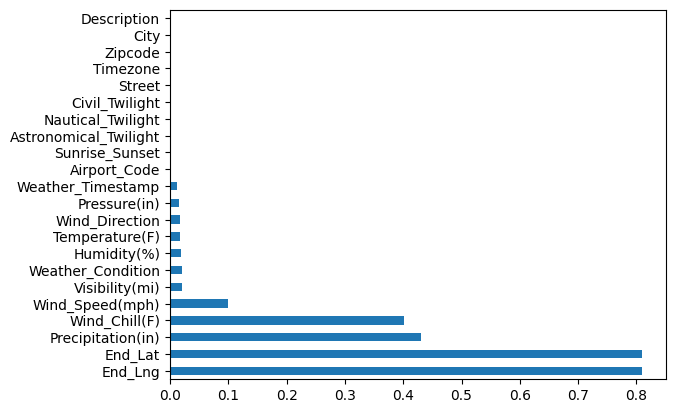

In [ ]:
missing_percentages[missing_percentages != 0].plot(kind='barh')

## Exploratory Analysis and Visualization

Columns we will analyze
  1. City
  2. Start Time
  3. Start Lat, Start Lng
  4. Temperature
  5. Weather Conditions

In [ ]:
df.columns

Index(['ID', 'Source', 'Severity', 'Start_Time', 'End_Time', 'Start_Lat',
       'Start_Lng', 'End_Lat', 'End_Lng', 'Distance(mi)', 'Description',
       'Street', 'City', 'County', 'State', 'Zipcode', 'Country', 'Timezone',
       'Airport_Code', 'Weather_Timestamp', 'Temperature(F)', 'Wind_Chill(F)',
       'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Direction',
       'Wind_Speed(mph)', 'Precipitation(in)', 'Weather_Condition', 'Amenity',
       'Bump', 'Crossing', 'Give_Way', 'Junction', 'No_Exit', 'Railway',
       'Roundabout', 'Station', 'Stop', 'Traffic_Calming', 'Traffic_Signal',
       'Turning_Loop', 'Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight',
       'Astronomical_Twilight'],
      dtype='object')

In [ ]:
df.City

,City
0,Dayton
1,Reynoldsburg
2,Williamsburg
3,Dayton
4,Dayton
...,...
4199995,San Antonio
4199996,Laguna Niguel
4199997,Broadway
4199998,Charlotte


In [ ]:
cities = df.City.unique()
len(cities)

12628

In [ ]:
cities_by_accident = df.City.value_counts()
cities_by_accident

,count
City,
Houston,124169
Charlotte,100980
Dallas,83297
Los Angeles,80274
Austin,73203
...,...
Solomons,1
De Queen,1
Lacona,1


In [ ]:
cities_by_accident[:20]

,count
City,
Houston,124169
Charlotte,100980
Dallas,83297
Los Angeles,80274
Austin,73203
Raleigh,58108
Miami,57726
Baton Rouge,47836
Atlanta,47376


In [ ]:
type(cities_by_accident)

pandas.core.series.Series

<Axes: ylabel='City'>

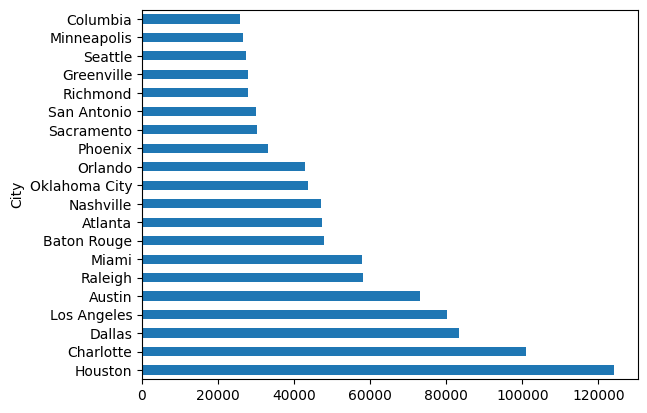

In [ ]:
cities_by_accident[:20].plot(kind='barh')

In [ ]:
import seaborn as sns
sns.set_style('darkgrid')

<Axes: xlabel='count', ylabel='Count'>

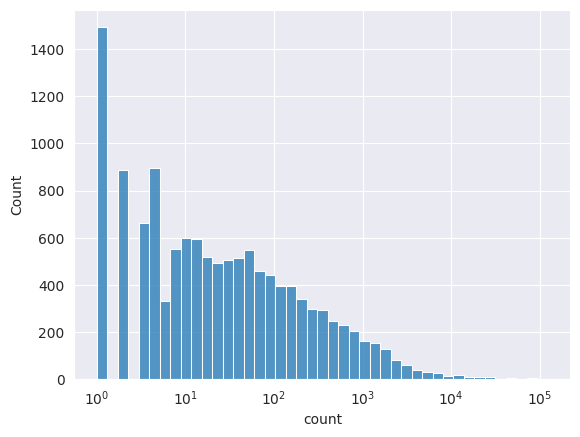

In [ ]:
sns.histplot(cities_by_accident, log_scale=True)

In [ ]:
cities_by_accident[cities_by_accident == 1]

,count
City,
New Salisbury,1
Lawsonville,1
Acosta,1
Trowbridge,1
Mt Pocono,1
...,...
Solomons,1
De Queen,1
Lacona,1


### Start Time

In [ ]:
df.Start_Time

,Start_Time
0,2016-02-08 05:46:00
1,2016-02-08 06:07:59
2,2016-02-08 06:49:27
3,2016-02-08 07:23:34
4,2016-02-08 07:39:07
...,...
4199995,2022-11-21 13:56:00.000000000
4199996,2022-01-02 18:54:00.000000000
4199997,2022-12-22 09:15:33.000000000
4199998,2022-01-30 11:49:30.000000000


In [ ]:
df['Start_Time'] = pd.to_datetime(df['Start_Time'], format='mixed', errors='coerce')

In [ ]:
df.Start_Time[0]

Timestamp('2016-02-08 05:46:00')

/tmp/ipython-input-3461750840.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df.Start_Time.dt.hour, bins=24, kde = False, norm_hist = True)


<Axes: xlabel='Start_Time'>

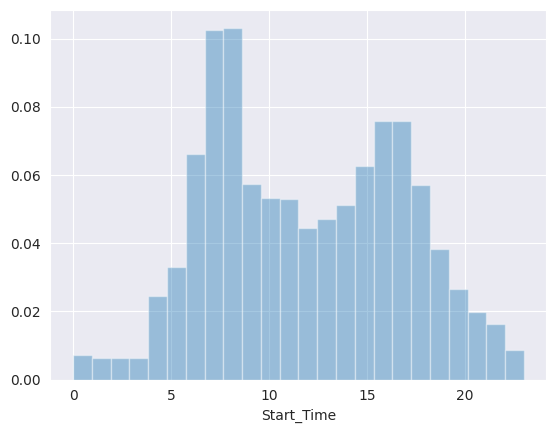

In [ ]:
sns.distplot(df.Start_Time.dt.hour, bins=24, kde = False, norm_hist = True)

- A high percentage of accidents occur between 6AM to 10AM (probably people in a hurry to get to work and high traffic)
- Next highest percentage is 3PM to 6PM

/tmp/ipython-input-872250719.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df.Start_Time.dt.dayofweek, bins=7, kde = False, norm_hist = True)


<Axes: xlabel='Start_Time'>

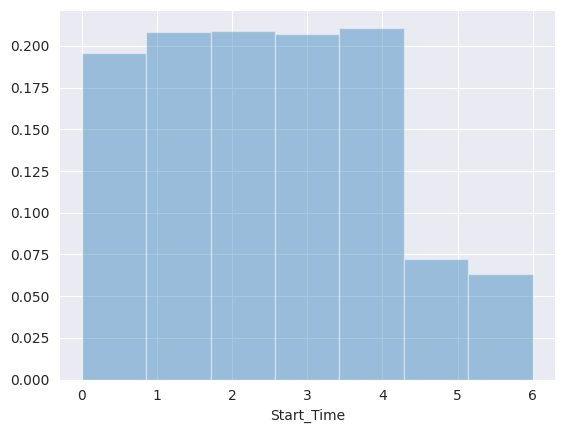

In [ ]:
sns.distplot(df.Start_Time.dt.dayofweek, bins=7, kde = False, norm_hist = True)

Is the distribution of accidents by hour same on weekends as on weekdays

/tmp/ipython-input-4194673101.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(sundays_start_time.dt.hour, bins=24, kde = False, norm_hist = True)


<Axes: xlabel='Start_Time'>

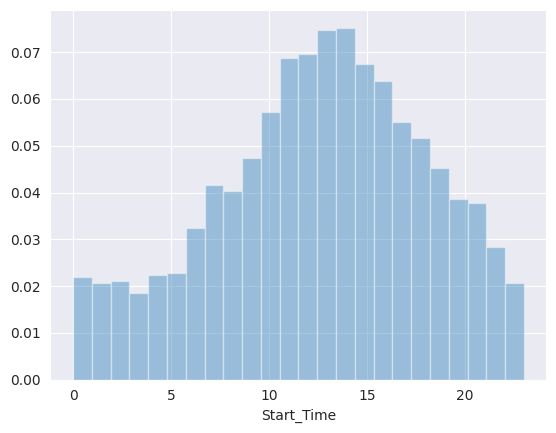

In [ ]:
sundays_start_time = df.Start_Time[df.Start_Time.dt.dayofweek == 6]
sns.distplot(sundays_start_time.dt.hour, bins=24, kde = False, norm_hist = True)

/tmp/ipython-input-2455122211.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(mondays_start_time.dt.hour, bins=24, kde = False, norm_hist = True)


<Axes: xlabel='Start_Time'>

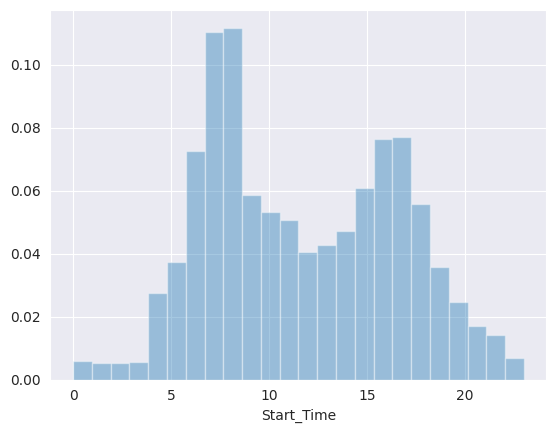

In [ ]:
mondays_start_time = df.Start_Time[df.Start_Time.dt.dayofweek == 0]
sns.distplot(mondays_start_time.dt.hour, bins=24, kde = False, norm_hist = True)

On Sundays the peak occurs between 10AM and 3PM, unlike weekdays

In [ ]:
df.Start_Time.dt.year

,Start_Time
0,2016
1,2016
2,2016
3,2016
4,2016
...,...
4199995,2022
4199996,2022
4199997,2022
4199998,2022


/tmp/ipython-input-88873278.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_2020.Start_Time.dt.month, bins=12, kde = False, norm_hist = True)


<Axes: xlabel='Start_Time'>

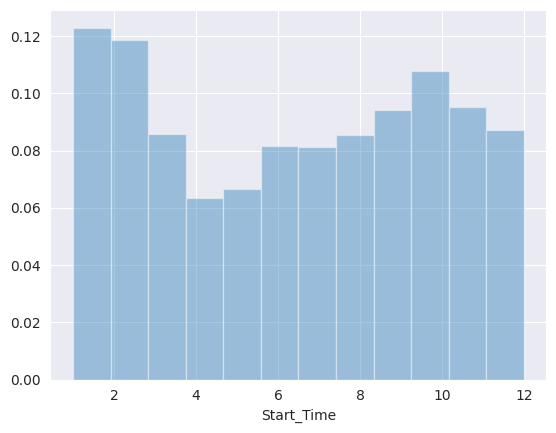

In [ ]:
df_2020 = df[df.Start_Time.dt.year == 2020]
sns.distplot(df_2020.Start_Time.dt.month, bins=12, kde = False, norm_hist = True)

Explain the month-wise trend of accidents?
  - Much data is missing for 2016, even for 2017
  -A sudden drop in 2020 maybe explained by the COVID-19 lockdowns and restrictions

In [ ]:
df.Source.values

array(['Source2', 'Source2', 'Source2', ..., 'Source1', 'Source1',
       'Source1'], dtype=object)

/tmp/ipython-input-811080495.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_2020_Source1.Start_Time.dt.month, bins=12, kde = False, norm_hist = True)


<Axes: xlabel='Start_Time'>

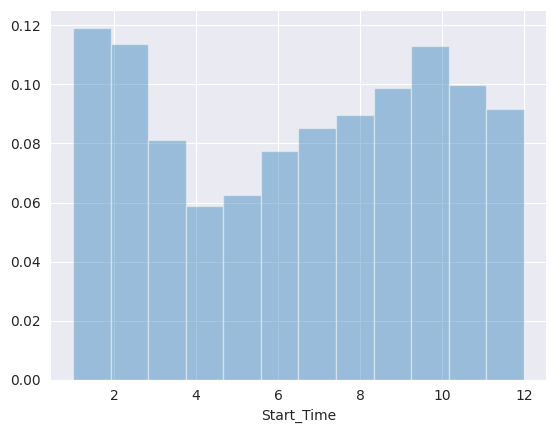

In [ ]:
df_2020 = df[df.Start_Time.dt.year == 2020]
df_2020_Source1 = df_2020[df_2020.Source == 'Source2']
sns.distplot(df_2020_Source1.Start_Time.dt.month, bins=12, kde = False, norm_hist = True)

There seems to be some issue with the Source1 and Source3 data, as it has too much of variation, whereas Source2 is much spreadout and even. Hence we drop the Source1 data

<Axes: ylabel='count'>

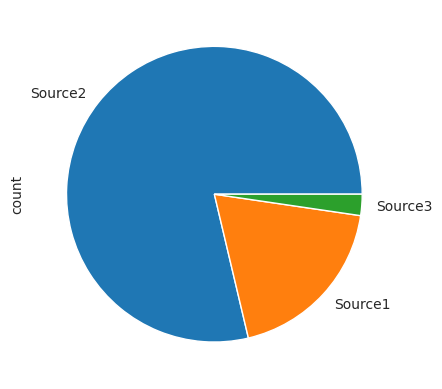

In [ ]:
df.Source.value_counts().plot(kind='pie')

- Consider excluding source 1 and source 3 data, seems to have issues

### Start Latitude and Start Longitude

In [ ]:
df.Start_Lat

,Start_Lat
0,39.865147
1,39.928059
2,39.063148
3,39.747753
4,39.627781
...,...
4199995,29.335842
4199996,33.568296
4199997,38.559770
4199998,35.155469


In [ ]:
df.Start_Lng

,Start_Lng
0,-84.058723
1,-82.831184
2,-84.032608
3,-84.205582
4,-84.188354
...,...
4199995,-98.569615
4199996,-117.672122
4199997,-78.746406
4199998,-80.794153


<Axes: xlabel='Start_Lng', ylabel='Start_Lat'>

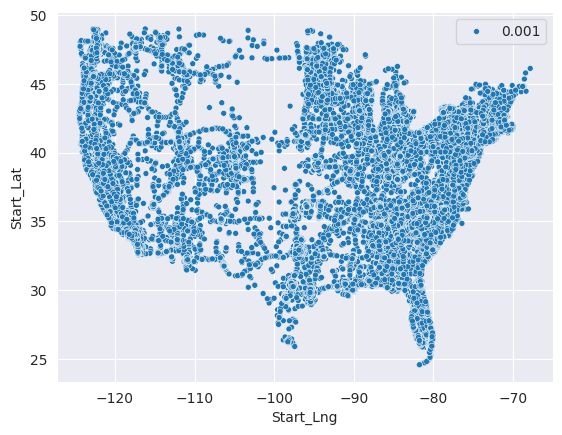

In [ ]:
sample_df = df.sample(int(0.1 * len(df)))
sns.scatterplot(x=sample_df.Start_Lng, y=sample_df.Start_Lat, size=0.001)

In [ ]:
import folium

In [ ]:
lat, lon = df.Start_Lat[0], df.Start_Lng[0]
lat, lon

(np.float64(39.865147), np.float64(-84.058723))

In [ ]:
from folium.plugins import HeatMap
sample_df = df.sample(int(0.1 * len(df)))
lat_lon_pairs = list(zip(list(sample_df.Start_Lat), list(sample_df.Start_Lng)))
map = folium.Map()
HeatMap(lat_lon_pairs).add_to(map)
map

## Ask and Answer Questions
  - Are there more accidents in warmer or colder areas?
  - Which 5 states have the highest number of accidents? How about per capita? Accidents per capita
  - Does New York show up in the data? If yes why is the count lower despite having highest population?
  - Among the top 100 cities by number of accidents which states do they belong to most frequntly
  - What time of day are accidents most frequent?
  - Which days of weeks have most accidents?
  - Which months have the most accidents?
  - What is the trend of accidents YoY (decreasing or increasing)
  - When is accidents per unit of traffic the highest



## Summary and Conclusion
Insights
  1. No data for New York
  2. About 5% of cities have more than 1000 yearly accidents
  3. Over 1200 cities have reported just one accident (need to investigate)
  4. The number of accidents per city follows an exponentially decreasing trend